# SPArrOW, how to start

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os

In [3]:
import sparrow as sp

ERROR:npe2.manifest.schema:napari.manifest -> 'napari-spongepy' could not be imported: Cannot find module 'napari_spongepy' declared in entrypoint: 'napari_spongepy:napari.yaml'


## 1. Read in the data

The first step of the SPArrOW pipeline includes reading in the raw data. This, minimally, includes the stained image(s) and the transcript locations.

The example dataset can be downloaded here (slide A1-1): https://cloud.irc.ugent.be/public/index.php/s/HrXG9WKqjqHBEzS?path=%2FResolveMouse

For the input images, there are different options (see API documentation for more details)

- input the image as a dask or numpy array
- define the path to the location the image is stored at (preferably tiff or zarr)
- define a list of paths for different stainings (stored in different channels)
- define a pattern representing a collection of z-stacks. (these are currently by default max-projcted to form one image). 

With the crd parameter, you can choose to only load in a part of your images. This is recommended for a quick walk-through. 

The transcript location file is expected to be a txt or csv file. For RESOLVE, StereoSeq and Vizgen, specific dataloaders are created (still in progress for xenium and CosMx). For a new datatype, you can read the API on the function sp.io.read_transcripts.

The image is thne read in to a SpatialData object (see https://spatialdata.scverse.org/en/latest/ for more information). As the Spatial datasets are often larger-than memory, a path to where all data will be stored is asked. 


When working on GPU, it is advisable to define a client to avoid memory issues.  

In [4]:
# uncommand this when working on GPU
# from dask.distributed import Client
# client = Client(n_workers=1, threads_per_worker=1, memory_limit='200GB',local_directory='/srv/scratch',dashboard_address=42738)
# client

In [7]:
# Path prefix for the data folder, use variable from .env file or default
DATA_PATH_PREFIX = "/srv/scratch/lottep/resolve"


OUTPUT_DIR = "/path/to/storage/sdata.zarr"
OUTPUT_DIR = "/srv/scratch/lottep/Sparrow/Segmentation_comparison_RESOLVE/sdata_objects/sdataA1-1_tutorial_4"

name_slide = "A1-1"
DATA_PATH_PREFIX = "/srv/scratch/data/spatial"
path_coordinates = "/transcript_locations.txt"
path_image = "/image_DAPI.tiff"
path_coordinates = DATA_PATH_PREFIX + "/resolve_liver/20272_slide1_" + name_slide + "_results.txt"
path_image = DATA_PATH_PREFIX + "/resolve_liver/20272_slide1_" + name_slide + "_DAPI.tiff"
crop_segment = False  # set to True to run tiling correction and segmentation step on a crop
if crop_segment:
    crop_param = [5000, 9000, 3000, 7000]  # x0,x1,y0,y1
else:
    crop_param = None

In [ ]:
# if you stopped your analysis during the process and want to pick it up where you left it,
# you can read in your sdata object as follows:
# from spatialdata import read_zarr
# sdata_load=read_zarr( os.path.join(  OUTPUT_DIR, 'sdata_allocation.zarr' ) )

### Convert to zarr and load the image. 

In [8]:
# select a subset
crd = [0, 2144 * 3, 0, 2144 * 3]  # crd: for tiling correction, the image size needs to be a multiple of the tiling size

img_layer = "raw_image"

sdata = sp.io.create_sdata(
    input=path_image, output_path=os.path.join(OUTPUT_DIR, "sdata.zarr"), img_layer=img_layer, chunks=1024, crd=crd
)

2024-06-10 09:49:43,976 - sparrow.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is (c, (z), y, x)
2024-06-10 09:49:43,995 - sparrow.image._manager - INFO - Writing results to layer 'raw_image'


In [9]:
sdata

SpatialData object with:
└── Images
      └── 'raw_image': SpatialImage[cyx] (1, 6432, 6432)
with coordinate systems:
▸ 'global', with elements:
        raw_image (Images)

### 1.1 Plot the image(s)

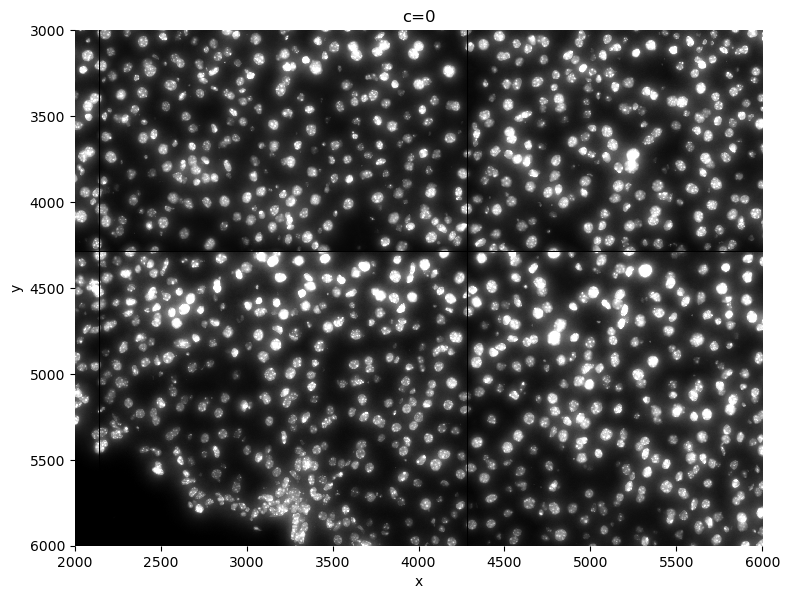

In [9]:
crd = [2000, 6000, 3000, 6000]  # crd used for visualization purposes

sp.pl.plot_image(sdata, img_layer="raw_image", crd=crd, figsize=(8, 8))

## 2. Processing the image(s)


### 2.1 tiling correction and inpainting

When working with RESOLVE data, the data is acquired in tiles, and the illumination within a tile isn't always constant. Sometimes one side of a tile is more illuminated than the other, influencing the downstream analysis greatly. RESOLVE assured us this isn't linked to the counts of the transcripts, but this can be checked further on.
In general this step is not necessary for other datatypes (you can check this by plotting the complete image). 

Basic is a tool that can correct for this, and is used in this function. The size of the tile needs to be known in order to run the function. The dfault value for this function is the tile size of RESOLVe (2144).

This step also corrects for black lines in between the tiles, by using inpainting. 

2024-06-10 09:49:49,887 - sparrow.image._tiling - WARNING - No image layer specified. Applying image processing on the last image layer 'raw_image' of the provided SpatialData object.


INFO:basicpy.basicpy:Initializing BaSiC 140561894472240 with parameters: 
smoothness_flatfield: 1

INFO:basicpy.basicpy:=== BaSiC fit started ===
INFO:basicpy.basicpy:reweighting iteration 0
INFO:basicpy.basicpy:single-step optimization score: 9.711147868074477e-07.
INFO:basicpy.basicpy:mean of S: 0.9999998807907104.
INFO:basicpy.basicpy:Iteration 0 finished.
INFO:basicpy.basicpy:reweighting iteration 1
INFO:basicpy.basicpy:single-step optimization score: 7.295529371731391e-07.
INFO:basicpy.basicpy:mean of S: 0.9999999403953552.
INFO:basicpy.basicpy:Iteration 1 finished.
INFO:basicpy.basicpy:reweighting score: 4.172325418494438e-07
INFO:basicpy.basicpy:elapsed time: 3.873811127617955 seconds
INFO:basicpy.basicpy:Reweighting converged.
INFO:basicpy.basicpy:=== BaSiC fit finished in 4.758937127888203 seconds ===
INFO:basicpy.basicpy:=== BaSiC transform started ===
INFO:basicpy.basicpy:=== BaSiC transform finished in 0.1964156785979867 seconds ===
2024-06-10 09:50:46,999 - sparrow.image._

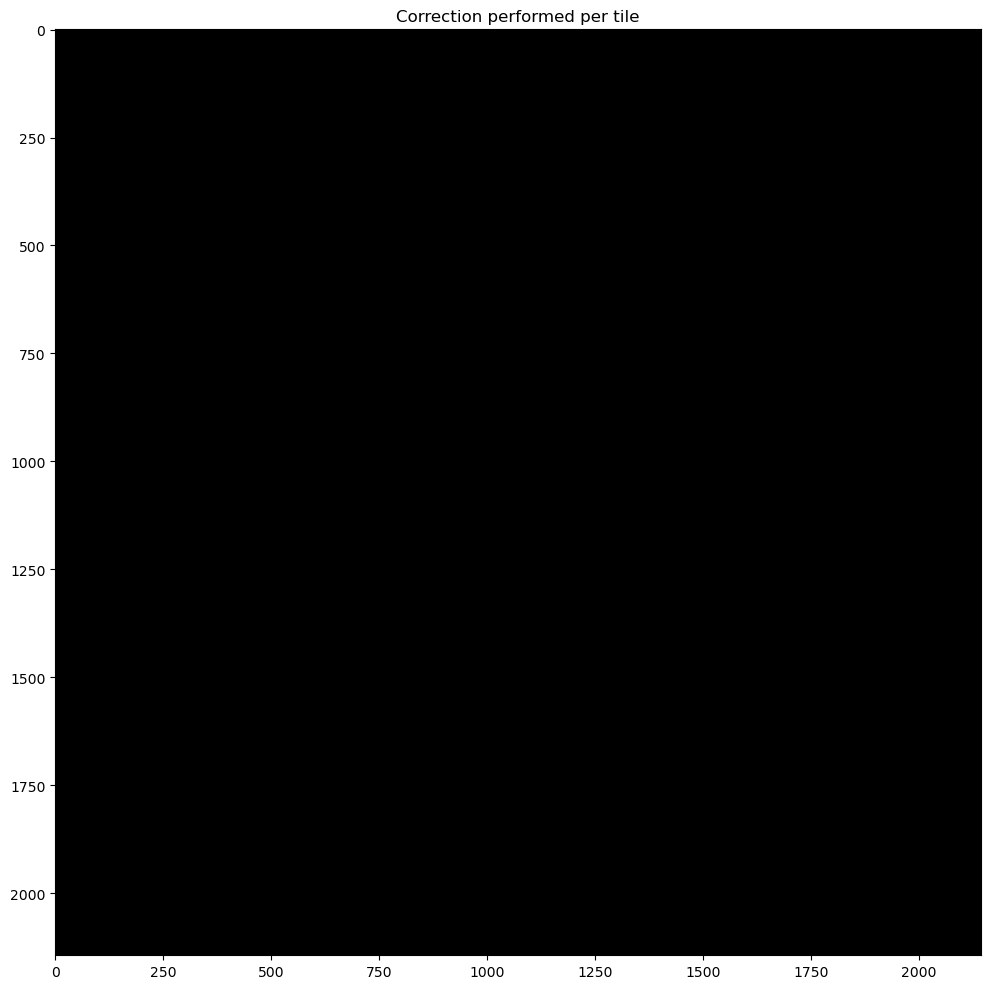

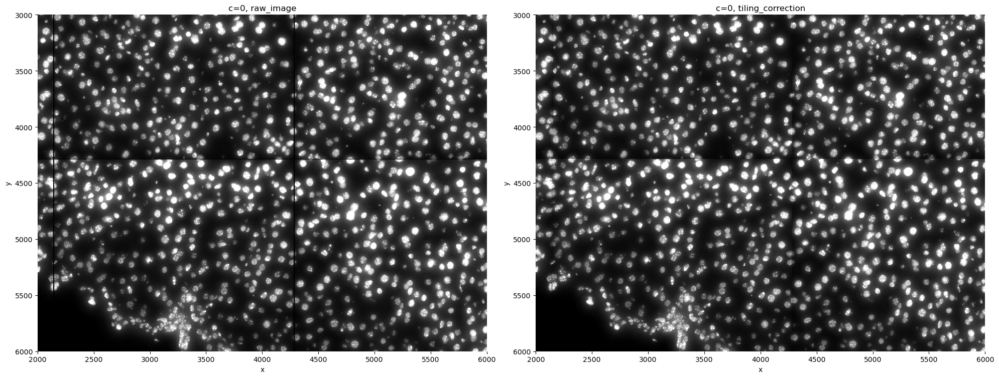

In [10]:
sdata, flatfields = sp.im.tiling_correction(sdata=sdata, crd=crop_param, output_layer="tiling_correction")

sp.pl.flatfield(flatfields[0])
sp.pl.tiling_correction(sdata, crd=crd, img_layer=["raw_image", "tiling_correction"])

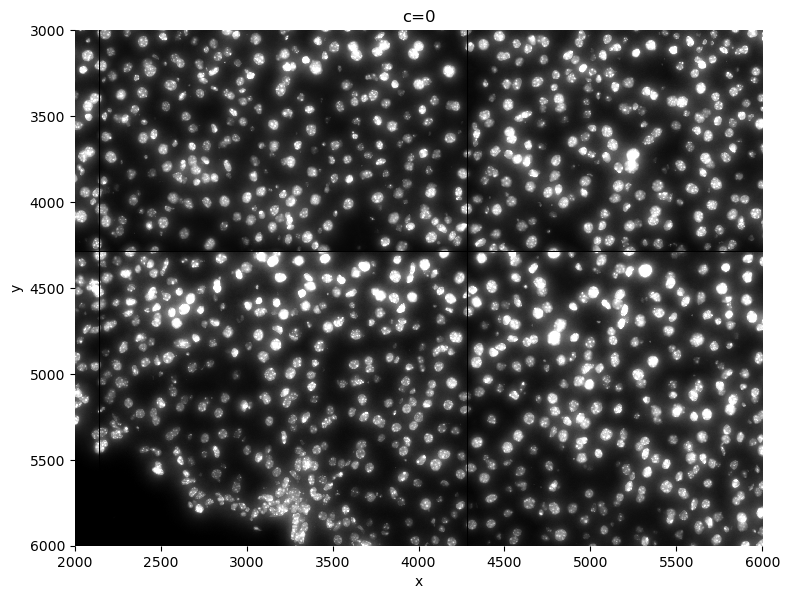

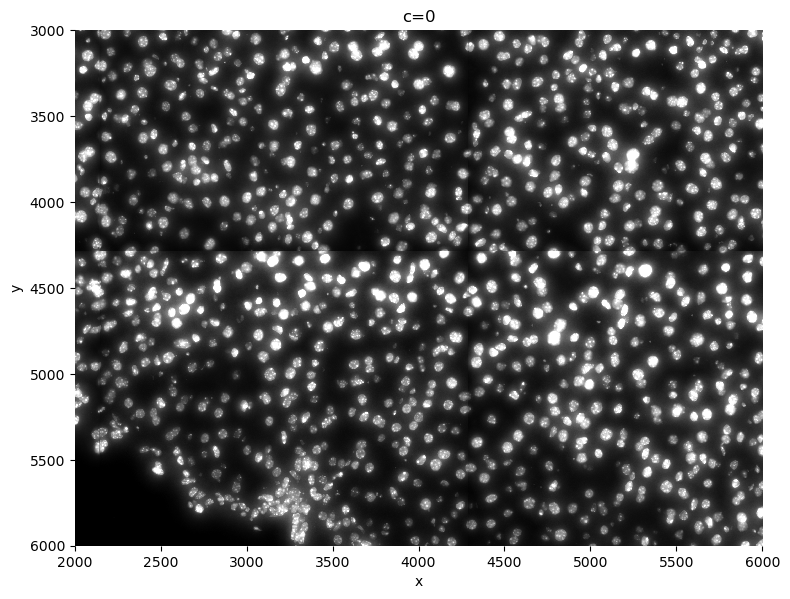

In [11]:
sp.pl.plot_image(sdata, img_layer="raw_image", crd=crd, figsize=(8, 8))
sp.pl.plot_image(sdata, img_layer="tiling_correction", crd=crd, figsize=(8, 8))

### 2.2 min-max filtering and contrast enhancing
The second step of the preprocessing the data includes a couple of steps:


- A min max filter can be added. The goal of this function is to substract background noise, and make the borders of the nuclei/cells cleaner, plus it will delete the occasional debris. If you take the size too small, smaller then the size of your nuclei, the function will create donuts, with black spots in the center of your cells.  If the size of the min max filter is chosen too big, not enough background is substracted, so a tradeoff should be made. This might need some finetuning. For nuclei in RESOLVE data, 45-55 is a great starting point. Bigger for whole cells. Adapt this parameter to make sure you delete debris and HALO's. 

- We recommend to perform contrast enhancing on your image. SPArrOW does this by using histogram equalization (CLAHE function). The amount of correction needed can be decided by adapting the contrast_clip value. If the image is already quite bright, 3.5 might be a good starting value. For dark images, you can go up to 10 or even more. Make sure at the end the whole image is evenly illuminated and no cells are dark in the background.

In every cleaning step, a new image is created and save to memory, hat is then used as an input for the next step. Note that it is currently not possible to overwrite these objects. You will have to define a new name every time you run the function, and thne in the end delete the images you don't need on disk. 
 
If you think you need more image processing, you can perform other steps using our apply function (see API? maybe not yet..) These images can then be added to the SpatialData object too

2024-06-10 09:50:50,701 - sparrow.image._minmax - WARNING - No image layer specified. Applying image processing on the last image layer 'tiling_correction' of the provided SpatialData object.
2024-06-10 09:50:50,702 - sparrow.image._apply - INFO - combine_z flag was set to False, while layer 'tiling_correction' does not contain a 'z' dimension, setting 'combine_z' to True for proper processing.
2024-06-10 09:50:50,703 - sparrow.image._apply - INFO - 'combine_c' is False, but not all channels spefified in 'fn_kwargs'/'func' ({'size_min_max_filter': 45}/<function min_max_filtering.<locals>._apply_min_max_filtering at 0x7fd5b45e57e0>). Specifying channels ([0]).
2024-06-10 09:50:50,713 - sparrow.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is (c, (z), y, x)
2024-06-10 09:50:50,723 - sparrow.image._manager - INFO - Writing results to layer 'min_max_filtered'


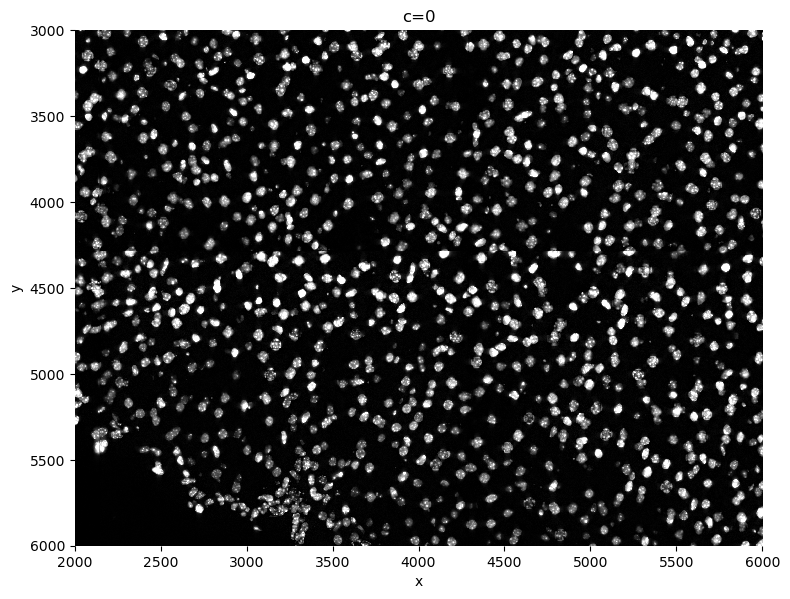

2024-06-10 09:50:53,570 - sparrow.image._contrast - WARNING - No image layer specified. Applying image processing on the last image layer 'min_max_filtered' of the provided SpatialData object.
2024-06-10 09:50:53,573 - sparrow.image._apply - INFO - combine_z flag was set to False, while layer 'min_max_filtered' does not contain a 'z' dimension, setting 'combine_z' to True for proper processing.
2024-06-10 09:50:53,574 - sparrow.image._apply - INFO - 'combine_c' is False, but not all channels spefified in 'fn_kwargs'/'func' ({'contrast_clip': 3.5}/<function enhance_contrast.<locals>._apply_clahe at 0x7fd5885fcc10>). Specifying channels ([0]).
2024-06-10 09:50:53,583 - sparrow.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is (c, (z), y, x)
2024-06-10 09:50:53,592 - sparrow.image._manager - INFO - Writing results to layer 'clahe'


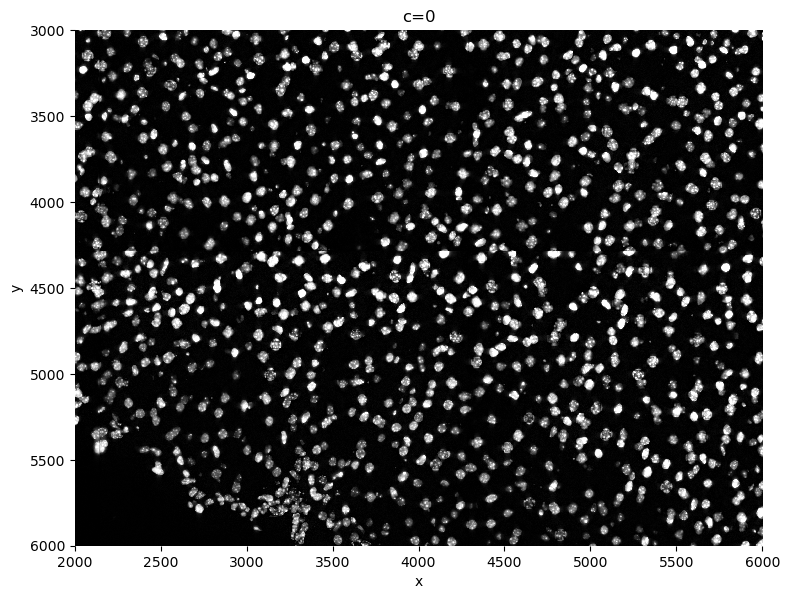

In [12]:
sdata = sp.im.min_max_filtering(sdata=sdata, output_layer="min_max_filtered", size_min_max_filter=45)
sp.pl.plot_image(sdata, img_layer="min_max_filtered", crd=crd, figsize=(8, 8))
sdata = sp.im.enhance_contrast(sdata=sdata, output_layer="clahe", contrast_clip=3.5, chunks=20000)
sp.pl.plot_image(sdata, img_layer="clahe", crd=crd, figsize=(8, 8))

## 3. Segmenting the image

For the segmentation, we here show an example on how to use cellpose, a deep learning network based on a UNET architecture. This is a great tool , because it segments both nuclei and whole cells. 

Multiple paramters need to be given as an input to the cellpose algorithm. We recommend tuning for the optimal segmentation quality. 
 
- diameter: Includes an estimate of the diameter of a nucleus. If put to none, cellpose will do the estimation by himself, but this estimation might take longer than the actual segmentation, and if often far off. Estimate around 7 micrometer (in this case 50 pixels at 0.138 micrometer per pixel) for a standard nucleus, and more for whole cells. Input is in pixels.This of course is tissue and method dependent. You can run the algorthim on a small piece (I[0:1000,0:1000] for example), to get an estimate of the size. However, this estimate isn't always accurate. So check the quality at the end. If you see all nuclei/cells are estimated too small, enlarge this parameter.
- device: Defines the device you want to work on, if you only have cpu, you can skip this input parameter. If only having CPU, please tune the parameters on a small subset, and then make it to the big one. This might take a while for large images, but it should work. 
- flow_threshold: Indicates something about the shape of the masks, if you increase it, more masks with less round shapes will be accepted. Up to one:  I take it between 0.6 and 0.95, depending on the cell shapes. Higher is less round. Lower it if you start segmenting artefacts, up it if you miss non-round shaped cells.
- mask_threshold: Indicates how many of the possible masks are kept. Making it smaller (up to -6), will give you more masks, bigger is less masks. I take it between 0 and -6. Be careful, you can oversegment: always check the quality 
- min_size: Indicates the minimal size of a nucleus. 
- If segmenting whole cells instead of nuclei, set the parameter model_type to 'cyto'.
- If using nuclei together with whole cells, put model_type to 'cyto', make sure your image is 3D and and that the first channel is you complete cell staining and you second one is the nucleus channel, put the parameter channel to np.array([1,0])

2024-06-10 09:51:21,215 - sparrow.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is (c, (z), y, x)
2024-06-10 09:51:21,226 - sparrow.image._manager - INFO - Writing results to layer 'segmentation_mask'
/srv/scratch/lottep/anaconda3/envs/napari-spongepy/lib/python3.10/site-packages/rasterio/features.py:128: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  for s, v in _shapes(source, mask, connectivity, transform):


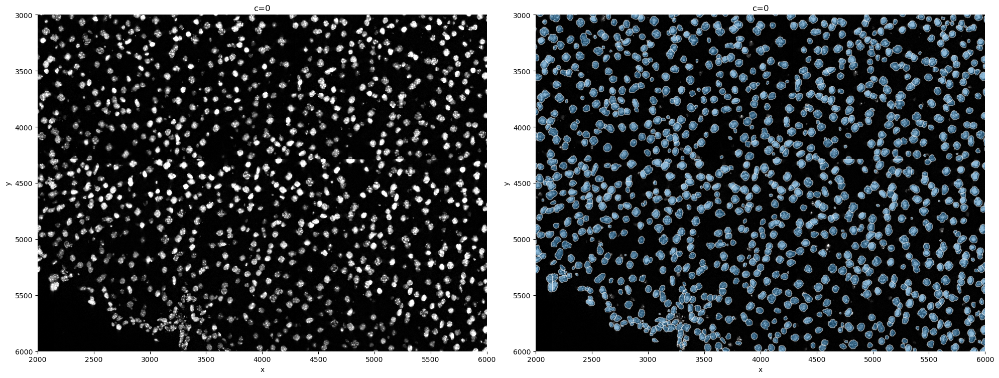

In [13]:
sdata = sp.im.segment(
    sdata=sdata,
    img_layer="clahe",
    output_labels_layer="segmentation_mask",
    output_shapes_layer="segmentation_mask_boundaries",
    crd=crop_param,
    device="cuda:3",
    min_size=80,
    flow_threshold=0.9,
    diameter=50,
    cellprob_threshold=-4,
    model_type="nuclei",
    chunks=2048,
    depth=(2 * 50, 2 * 50),
)

sp.pl.segment(sdata=sdata, crd=crd, img_layer="clahe", shapes_layer="segmentation_mask_boundaries")

This is in general not recommended, but it is possible to expand cells beyond the segmented bodies. This is done by creating voronoi expansions cut off by a certain expansion parameter. This parameter indicates how far the expansion ratio goes. The expansion is save in a separate shapes layer.

In [12]:
voronoi = False
if voronoi:
    sdata = sp.sh.create_voronoi_boundaries(sdata, radius=20, shapes_layer="segmentation_mask_boundaries")
    sp.pl.segment(sdata=sdata, crd=crd, img_layer="clahe", shapes_layer="expanded_cells20")

# 4. Allocating  the transcripts
###  4.1 Creating the count matrix
In this step we
- load in the transcipts: in the case of RESOLVE this is done with a specific loader. If no specific loader exist for your datatype, you can use the general read_transcripts function.
- allocate the transcripts to the correct cell. This allocation step creates the count matrix, saved in an anndata object that is reachable by typing sdata.table
- Visual checks


In [14]:
sdata = sp.io.read_resolve_transcripts(sdata, path_count_matrix=path_coordinates)

sdata = sp.tb.allocate(sdata=sdata, shapes_layer="segmentation_mask_boundaries")

2024-06-10 09:51:28,108 - sparrow.io._transcripts - INFO - No transform matrix given, will use identity matrix.
2024-06-10 09:51:28,110 - sparrow.io._transcripts - INFO - Transform matrix used:
 [[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]


2024-06-10 09:51:31,096 - sparrow.table._allocation - INFO - Creating masks from polygons.
2024-06-10 09:51:31,878 - sparrow.table._allocation - INFO - Created masks with shape (6432, 6432).
2024-06-10 09:51:32,083 - sparrow.table._allocation - INFO - Calculating cell counts.
2024-06-10 09:51:33,744 - sparrow.table._allocation - INFO - Finished calculating cell counts.
2024-06-10 09:51:33,746 - sparrow.table._allocation - INFO - Creating AnnData object.
2024-06-10 09:51:33,858 - sparrow.shape._manager - INFO - Filtering 17 cells from shapes layer 'segmentation_mask_boundaries'. Adding new shapes layer 'filtered_segmentation_segmentation_mask_boundaries' containing these filtered out polygons.


This nextp lot can be used to check counts on specific cells

In [15]:
# some sanity checks
sdata.table["131", "Ghr"].to_df()

gene,Ghr
cells,
131,8


plot transcripts matrix for cell 131 and gene Ghr


2024-06-10 09:51:34,773 - sparrow.plot._sanity - INFO - Plotting 44 transcripts.
2024-06-10 09:51:34,776 - sparrow.plot._sanity - INFO - Selecting boundaries
2024-06-10 09:51:35,283 - sparrow.plot._sanity - INFO - Plotting boundaries
2024-06-10 09:51:35,344 - sparrow.plot._sanity - INFO - End plotting boundaries


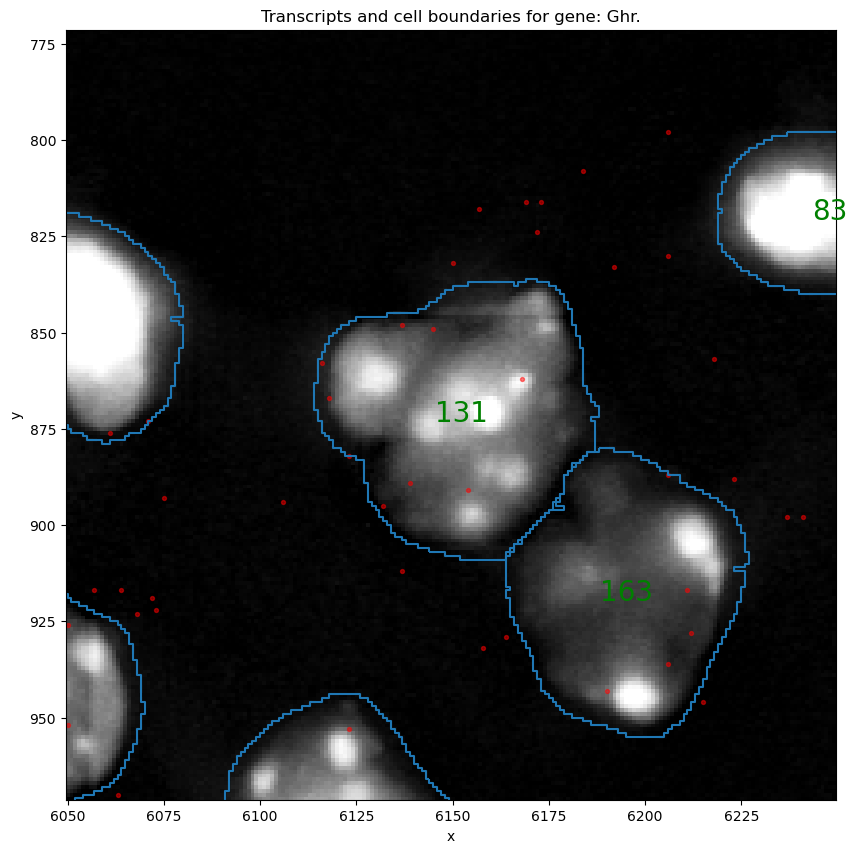

In [16]:
random_cell = "131"
random_gene = "Ghr"

diameter = 50

if random_cell is not None and random_gene is not None:
    cell_center = sdata.table.obsm["spatial"][sdata.table.to_df().index.get_loc(str(random_cell))]
    crd = [
        cell_center[0] - (diameter + 50),
        cell_center[0] + (diameter + 50),
        cell_center[1] - (diameter + 50),
        cell_center[1] + (diameter + 50),
    ]

    print(f"plot transcripts matrix for cell {random_cell} and gene {random_gene}")

    sp.pl.sanity_plot_transcripts_matrix(
        sdata=sdata,
        img_layer="clahe",
        points_layer="transcripts",
        shapes_layer="segmentation_mask_boundaries",
        crd=crd,
        plot_cell_number=True,
        gene=random_gene,
    )

In this step, there might be semgented entities that do not contain any transcripts. These entities are filtered out of the semgentation_mask_boundaries shapes layer and aren't added to the anndata. Instead these shapes are now saved in filtered_semgentation_segmentation_mask_boundaries.

It is possible to visualize these entities on the image with red borders, by making use of the shapes_layer_filtered parameter. As you can see, in this case, only 17 entities were filtered. This will be very dataset dependent. When there are regions with necrosis for example, this number will be way higher. 

Visualizing these cells shows clearly on plots that those cells weren't missed with segmentation, but were missed becasue of no transcripts measured, an issue? SPArrOW cannot solve.

In [17]:
sdata

SpatialData object with:
├── Images
│     ├── 'clahe': SpatialImage[cyx] (1, 6432, 6432)
│     ├── 'min_max_filtered': SpatialImage[cyx] (1, 6432, 6432)
│     ├── 'raw_image': SpatialImage[cyx] (1, 6432, 6432)
│     └── 'tiling_correction': SpatialImage[cyx] (1, 6432, 6432)
├── Labels
│     └── 'segmentation_mask': SpatialImage[yx] (6432, 6432)
├── Points
│     └── 'transcripts': DataFrame with shape: (4754932, 3) (2D points)
├── Shapes
│     ├── 'filtered_segmentation_segmentation_mask_boundaries': GeoDataFrame shape: (17, 1) (2D shapes)
│     └── 'segmentation_mask_boundaries': GeoDataFrame shape: (3375, 1) (2D shapes)
└── Table
      └── AnnData object with n_obs × n_vars = 3375 × 100
    obs: 'cell_ID', 'fov_labels'
    uns: 'spatialdata_attrs'
    obsm: 'spatial': AnnData (3375, 100)
with coordinate systems:
▸ 'global', with elements:
        clahe (Images), min_max_filtered (Images), raw_image (Images), tiling_correction (Images), segmentation_mask (Labels), transcripts (Points),

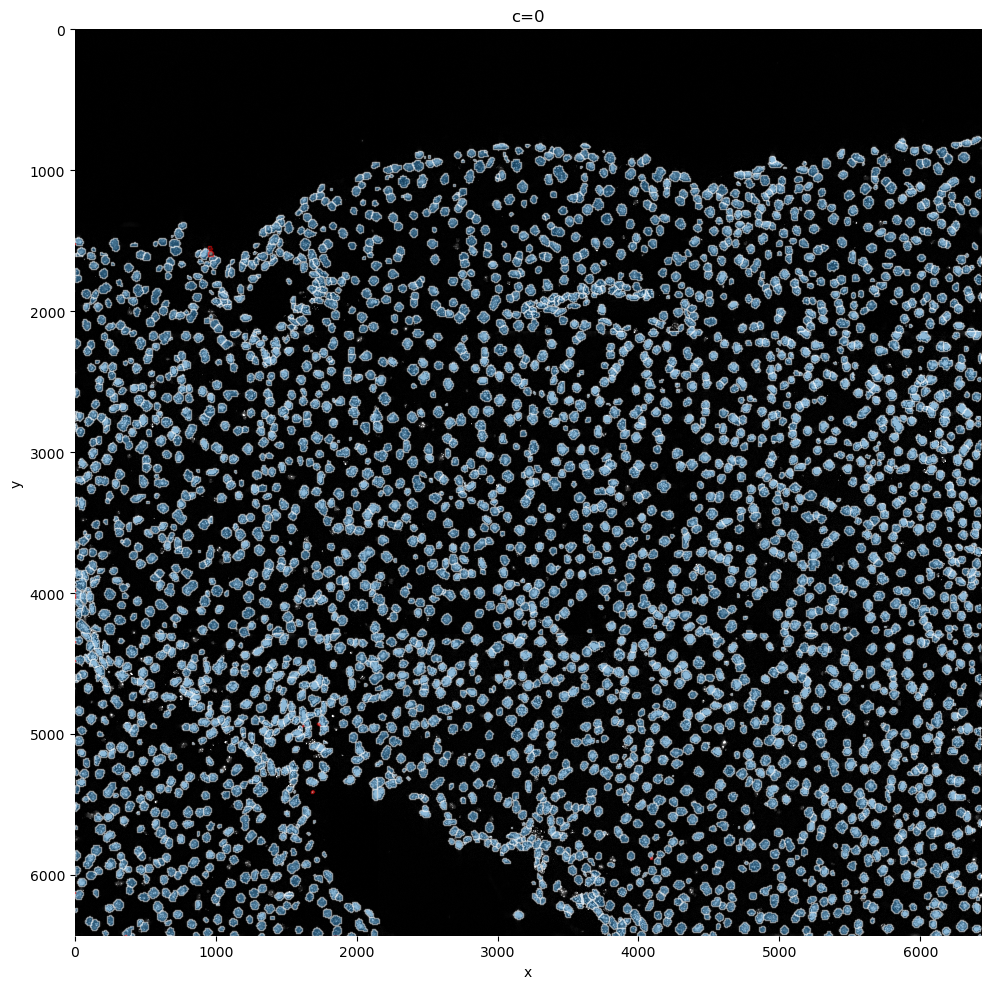

In [18]:
sp.pl.plot_shapes(
    sdata,
    img_layer="clahe",
    shapes_layer="segmentation_mask_boundaries",
    shapes_layer_filtered="filtered_segmentation_segmentation_mask_boundaries",
)

###  4.2 Transcript quality plot
After we have created the anndata object, we control the transcript quality. 

First we create a plot to chekc if the transcript density is similar across the whole tissue. If this isn't the case, it can have multiple reasons. Most likely, there will be regions in which the transcript pick-up was less succesfull. Also gene panel choices can influence this plot. 



2024-06-10 09:51:40,525 - sparrow.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is (c, (z), y, x)
2024-06-10 09:51:40,537 - sparrow.image._manager - INFO - Writing results to layer 'transcript_density'


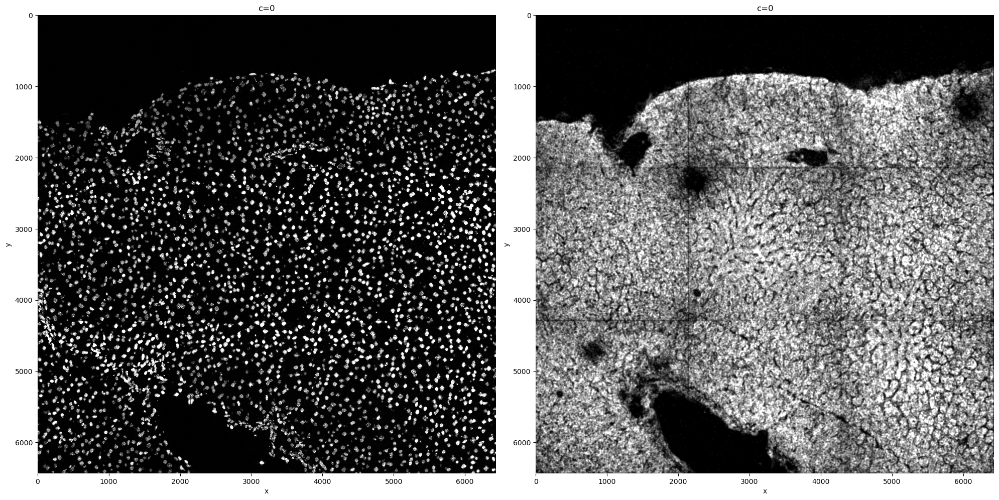

In [19]:
crd = [0, 2144 * 3, 0, 2144 * 3]  # crd: for tiling correction, the image size needs to be a multiple of the tiling size

sdata = sp.im.transcript_density(
    sdata, points_layer="transcripts", output_layer="transcript_density", crd=crd
)  # transcript_density added to sdata object.
sp.pl.transcript_density(sdata, img_layer=["clahe", "transcript_density"])

As not all of the image surface is segmented, there will be most likely transcripts that weren't assigned to a cell. 
For sure in the case of nucleus segmentation (like this example), this will be the case.

In general, we hope to not lose any genes. So we hope there aren't genes with low abundances and a low proportion kept. In general we see a downward trend. The more a gene is measured, the less it is located in cells (in ratio).

We also provide a table with the genes that are the least located in cells. If a lot of these genes arem akrers for the same celltype, the staining might bem issing this celltype and you should for sure check this. However, it might also be the case that is celltype just has a lot of cytoplasm and you are only semgenting the nucleus.

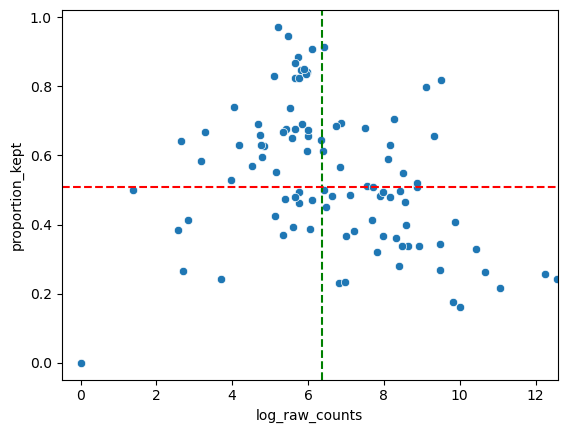

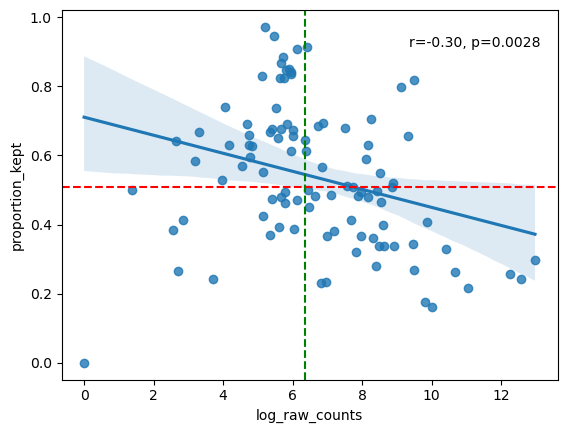

2024-06-10 09:51:49,508 - sparrow.plot._transcripts - INFO - The ten genes with the highest proportion of transcripts filtered out in the region of interest ([x_min,x_max,y_min,y_max]=(0, 6432, 0, 6432)):
          proportion_kept  raw_counts
gene                                 
Ms4a7            0.000000           1
Gls2             0.162059       21992
Glul             0.175853       18197
Ghr              0.216907       63345
Atp6v0d2         0.231023         909
Des              0.232361        1063
Cyp2e1           0.241339      289182
Folr2            0.243902          41
Fn1              0.257792      210546
Hal              0.262826       43428


In [20]:
filtered = sp.pl.analyse_genes_left_out(sdata)

# 5. Preprocess adata 
### 5.1 Filtering and Normalization

The anndata object is now processed:

- calculate QC metrics
- filter cells with less then 10 gene counts and genes with less then 5 cells (adaptations possible by adapting the function). These filtered cells are again filtered out of the shapes layer and the anndata obejct and saved in an extra shapes layer.
- Normalization: For small gene panel (<500), we recommend to normalize the data based on the size of the segmented object (size_norm=True). For transcriptome-wide methods, we recommend standard library size normalization (size_norm=False). 


The last plot shows the size of the nucleus related to the counts. When working with whole cells, if there are some really big xcells with really low counts, they are probably not real cells and you should filter based on max size. 

In [21]:
sdata

SpatialData object with:
├── Images
│     ├── 'clahe': SpatialImage[cyx] (1, 6432, 6432)
│     ├── 'min_max_filtered': SpatialImage[cyx] (1, 6432, 6432)
│     ├── 'raw_image': SpatialImage[cyx] (1, 6432, 6432)
│     ├── 'tiling_correction': SpatialImage[cyx] (1, 6432, 6432)
│     └── 'transcript_density': SpatialImage[cyx] (1, 6432, 6432)
├── Labels
│     └── 'segmentation_mask': SpatialImage[yx] (6432, 6432)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 3) (2D points)
├── Shapes
│     ├── 'filtered_segmentation_segmentation_mask_boundaries': GeoDataFrame shape: (17, 1) (2D shapes)
│     └── 'segmentation_mask_boundaries': GeoDataFrame shape: (3375, 1) (2D shapes)
└── Table
      └── AnnData object with n_obs × n_vars = 3375 × 100
    obs: 'cell_ID', 'fov_labels'
    uns: 'spatialdata_attrs'
    obsm: 'spatial': AnnData (3375, 100)
with coordinate systems:
▸ 'global', with elements:
        clahe (Images), min_max_filtered (Images), raw_image (Images), tiling_co

In [22]:
sdata.table.to_df().sum()

gene
Acta2        897
Adamtsl2     671
Adgre1       533
Adgrg6       268
Atp6v0d2     210
            ... 
Vwf         1148
Wnt2         162
Wnt9b         53
Wt1           75
Xcr1          73
Length: 100, dtype: int64

2024-06-10 09:51:50,045 - sparrow.shape._manager - INFO - Filtering 94 cells from shapes layer 'segmentation_mask_boundaries'. Adding new shapes layer 'filtered_low_counts_segmentation_mask_boundaries' containing these filtered out polygons.


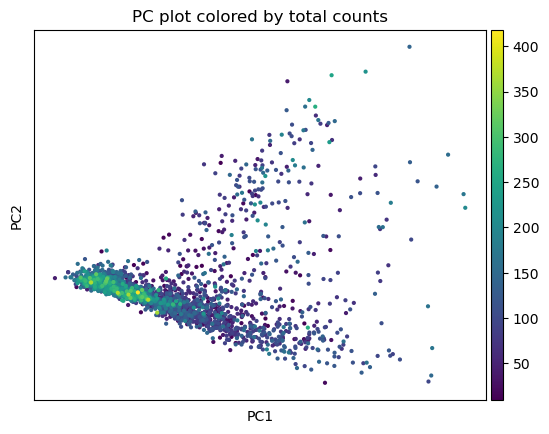

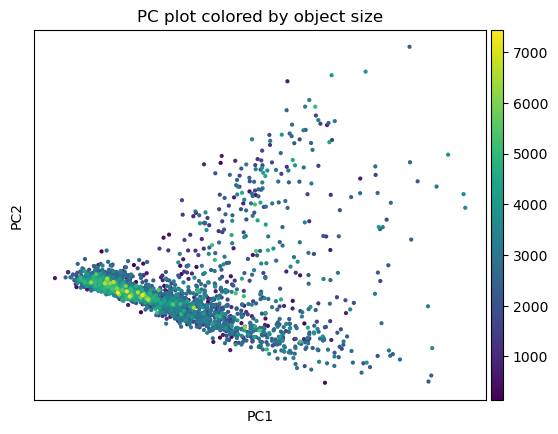

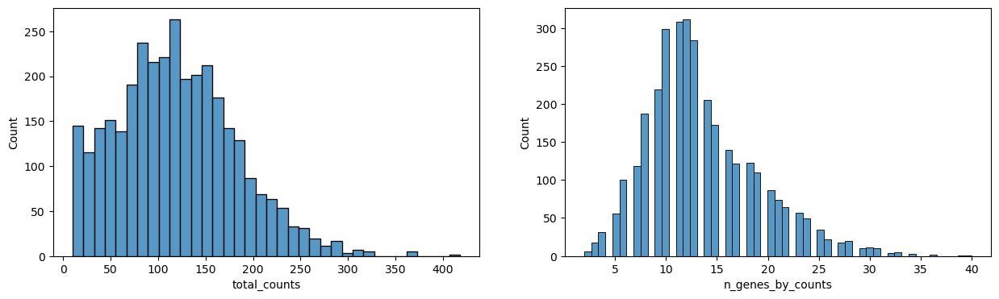

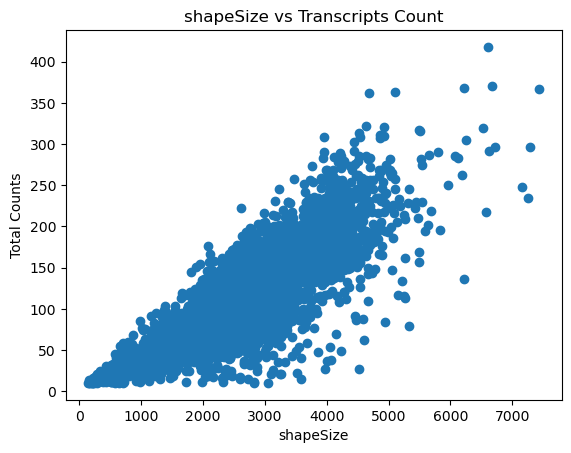

In [23]:
sdata = sp.tb.preprocess_anndata(
    sdata=sdata,
    size_norm=True,
    shapes_layer="segmentation_mask_boundaries",
)
sp.pl.preprocess_anndata(sdata)

In [24]:
sdata.table

AnnData object with n_obs × n_vars = 3281 × 97
    obs: 'cell_ID', 'fov_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes', 'pct_counts_in_top_5_genes', 'n_counts', 'shapeSize'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std'
    uns: 'spatialdata_attrs', 'log1p', 'pca'
    obsm: 'spatial', 'X_pca'
    varm: 'PCs'
    layers: 'raw_counts'

the raw counts are saved in sdata.table.layers['raw_counts']. The normalized data in sdata.table.raw and the scaled counts in sdata.table.X

In [25]:
sdata.table.raw.to_adata().to_df()

gene,Acta2,Adamtsl2,Adgre1,Adgrg6,Atp6v0d2,Axl,C5ar1,Ccr2,Ccr7,Cd19,...,Svep1,Timd4,Tmem119,Trem2,Vsig4,Vwf,Wnt2,Wnt9b,Wt1,Xcr1
cells,,,,,,,,,,,,,,,,,,,,,
17,0.0,0.026429,0.000000,0.0,0.0,0.026429,0.000000,0.000000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.052177,0.0
18,0.0,0.000000,0.406579,0.0,0.0,0.154628,0.080300,0.000000,0.0,0.0,...,0.000000,0.0,0.223812,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0
33,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.0,0.055756,0.000000,0.000000,0.0,0.0,0.0,0.055756,0.0
34,0.0,0.161194,0.024680,0.0,0.0,0.117728,0.000000,0.000000,0.0,0.0,...,0.072286,0.0,0.048766,0.000000,0.000000,0.0,0.0,0.0,0.072286,0.0
35,0.0,0.000000,0.171594,0.0,0.0,0.139550,0.036755,0.036755,0.0,0.0,...,0.000000,0.0,0.139550,0.106446,0.000000,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8024,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.034356,0.0,0.0,0.0,0.000000,0.0
8040,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0
8056,0.0,0.000000,0.056995,0.0,0.0,0.110917,0.110917,0.000000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.056995,0.0,0.0,0.0,0.000000,0.0


In [26]:
sdata.table.to_df()[:10]

gene,Acta2,Adamtsl2,Adgre1,Adgrg6,Atp6v0d2,Axl,C5ar1,Ccr2,Ccr7,Cd19,...,Svep1,Timd4,Tmem119,Trem2,Vsig4,Vwf,Wnt2,Wnt9b,Wt1,Xcr1
cells,,,,,,,,,,,,,,,,,,,,,
17,-0.107899,0.471781,-0.203092,-0.149993,-0.200649,0.128450,-0.17610,-0.109637,-0.071284,-0.094016,...,-0.124104,-0.120199,-0.162561,-0.093363,-0.214527,-0.153859,-0.134714,-0.065573,4.028224,-0.071333
18,-0.107899,-0.180655,10.000000,-0.149993,-0.200649,2.271410,5.68309,-0.109637,-0.071284,-0.094016,...,-0.124104,-0.120199,10.000000,-0.093363,-0.214527,-0.153859,-0.134714,-0.065573,-0.069196,-0.071333
33,-0.107899,-0.180655,-0.203092,-0.149993,-0.200649,-0.313325,-0.17610,-0.109637,-0.071284,-0.094016,...,-0.124104,-0.120199,2.994002,-0.093363,-0.214527,-0.153859,-0.134714,-0.065573,4.309291,-0.071333
34,-0.107899,3.798689,0.637410,-0.149993,-0.200649,1.654583,-0.17610,-0.109637,-0.071284,-0.094016,...,10.000000,-0.120199,2.598302,-0.093363,-0.214527,-0.153859,-0.134714,-0.065573,5.607387,-0.071333
35,-0.107899,-0.180655,5.640619,-0.149993,-0.200649,2.019369,2.50580,1.279692,-0.071284,-0.094016,...,-0.124104,-0.120199,7.737951,10.000000,-0.214527,-0.153859,-0.134714,-0.065573,-0.069196,-0.071333
48,-0.107899,-0.180655,-0.203092,-0.149993,-0.200649,-0.313325,-0.17610,-0.109637,-0.071284,-0.094016,...,-0.124104,-0.120199,-0.162561,-0.093363,-0.214527,-0.153859,-0.134714,-0.065573,-0.069196,-0.071333
49,-0.107899,8.130873,-0.203092,-0.149993,-0.200649,0.284158,-0.17610,-0.109637,-0.071284,-0.094016,...,-0.124104,-0.120199,7.530950,-0.093363,-0.214527,-0.153859,-0.134714,-0.065573,10.000000,-0.071333
64,-0.107899,-0.180655,-0.203092,-0.149993,-0.200649,-0.313325,-0.17610,-0.109637,-0.071284,-0.094016,...,-0.124104,-0.120199,-0.162561,-0.093363,-0.214527,-0.153859,-0.134714,-0.065573,-0.069196,-0.071333
65,-0.107899,-0.180655,-0.203092,-0.149993,-0.200649,-0.313325,-0.17610,-0.109637,-0.071284,-0.094016,...,-0.124104,-0.120199,10.000000,-0.093363,-0.214527,-0.153859,-0.134714,-0.065573,-0.069196,-0.071333


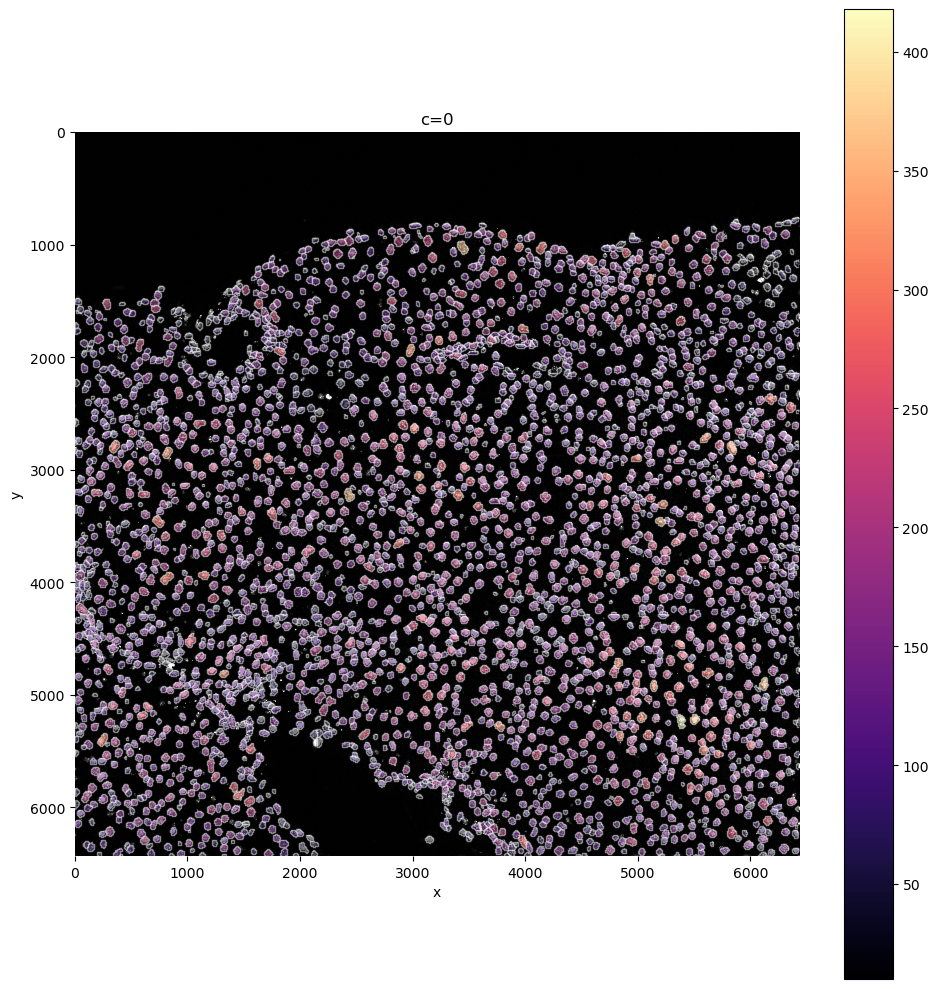

In [27]:
sp.pl.plot_shapes(sdata, column="total_counts", img_layer="clahe", shapes_layer="segmentation_mask_boundaries")

In this step you can filter cells based on their size: are you sure cells need to be bigger, or sure your cells can not be larger than X? 

You can delete them with this function by defining min_size and max_size. 

2024-06-10 09:51:55,318 - sparrow.shape._manager - INFO - Filtering 81 cells from shapes layer 'segmentation_mask_boundaries'. Adding new shapes layer 'filtered_size_segmentation_mask_boundaries' containing these filtered out polygons.
2024-06-10 09:51:55,382 - sparrow.table._table - INFO - 81 cells were filtered out based on size.


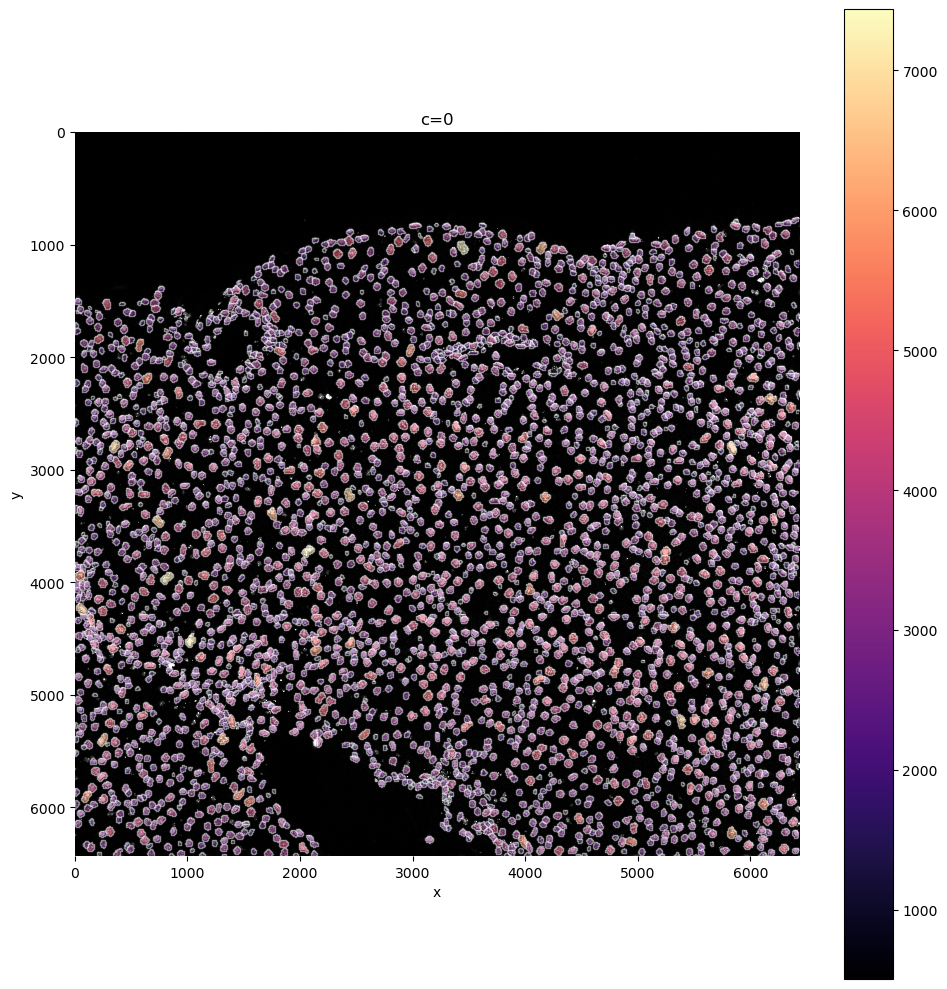

In [28]:
sdata = sp.tb.filter_on_size(sdata, min_size=500)
sp.pl.plot_shapes(sdata, column="shapeSize", img_layer="clahe", shapes_layer="segmentation_mask_boundaries")

You can see all filtered layers present in your sdata object under shapes

In [30]:
sdata

SpatialData object with:
├── Images
│     ├── 'clahe': SpatialImage[cyx] (1, 6432, 6432)
│     ├── 'min_max_filtered': SpatialImage[cyx] (1, 6432, 6432)
│     ├── 'raw_image': SpatialImage[cyx] (1, 6432, 6432)
│     ├── 'tiling_correction': SpatialImage[cyx] (1, 6432, 6432)
│     └── 'transcript_density': SpatialImage[cyx] (1, 6432, 6432)
├── Labels
│     └── 'segmentation_mask': SpatialImage[yx] (6432, 6432)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 3) (2D points)
├── Shapes
│     ├── 'filtered_low_counts_segmentation_mask_boundaries': GeoDataFrame shape: (94, 1) (2D shapes)
│     ├── 'filtered_segmentation_segmentation_mask_boundaries': GeoDataFrame shape: (17, 1) (2D shapes)
│     ├── 'filtered_size_segmentation_mask_boundaries': GeoDataFrame shape: (81, 1) (2D shapes)
│     └── 'segmentation_mask_boundaries': GeoDataFrame shape: (3200, 1) (2D shapes)
└── Table
      └── AnnData object with n_obs × n_vars = 3200 × 97
    obs: 'cell_ID', 'fov_labels', 'n_g

### 5.2 Clustering

This function performs the neighborhood analysis and the leiden clustering and the UMAP calculations using standar scanpy functions.

You need to define 2 parameters:
- the amount of PC's used: I normally choose something between 15-20 based on the plot of PC's.
- The amount of neighbors used: Normally I go for 35. Less neighbors means more spread, more means everything tighter, in general.

It returns the UMAP and marker gene list per cluster, that can be looked at for finding celltypes. 

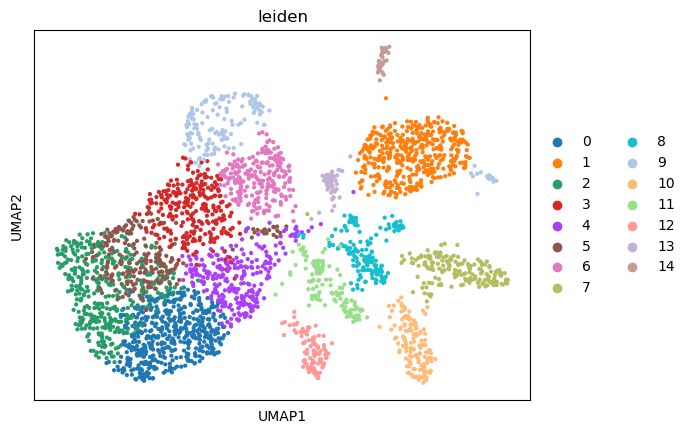

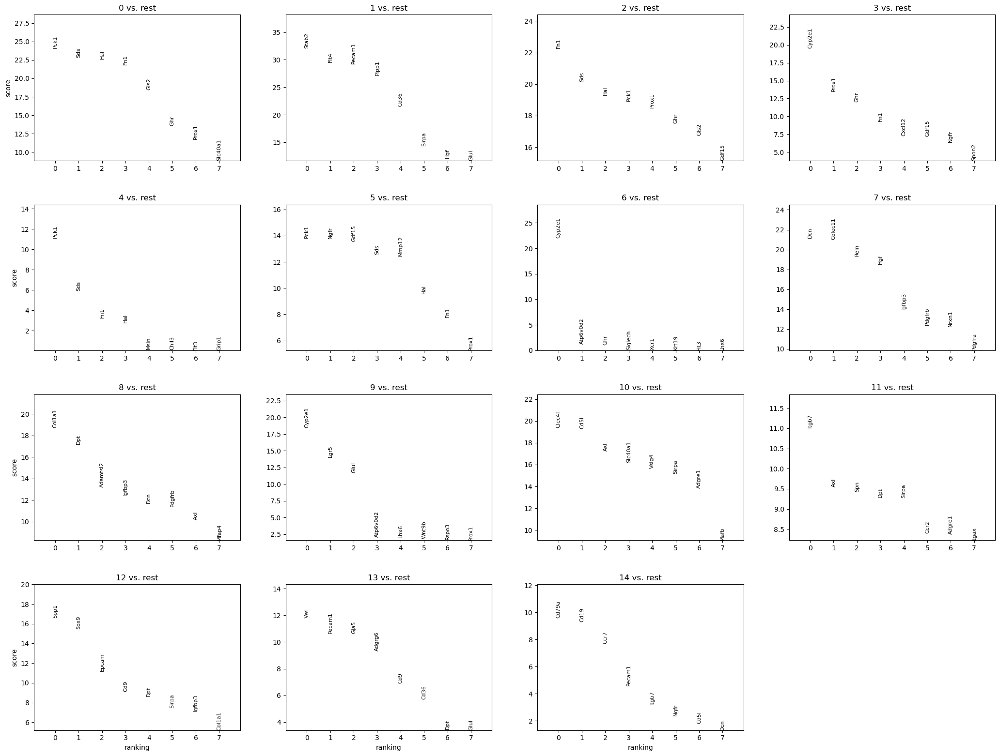

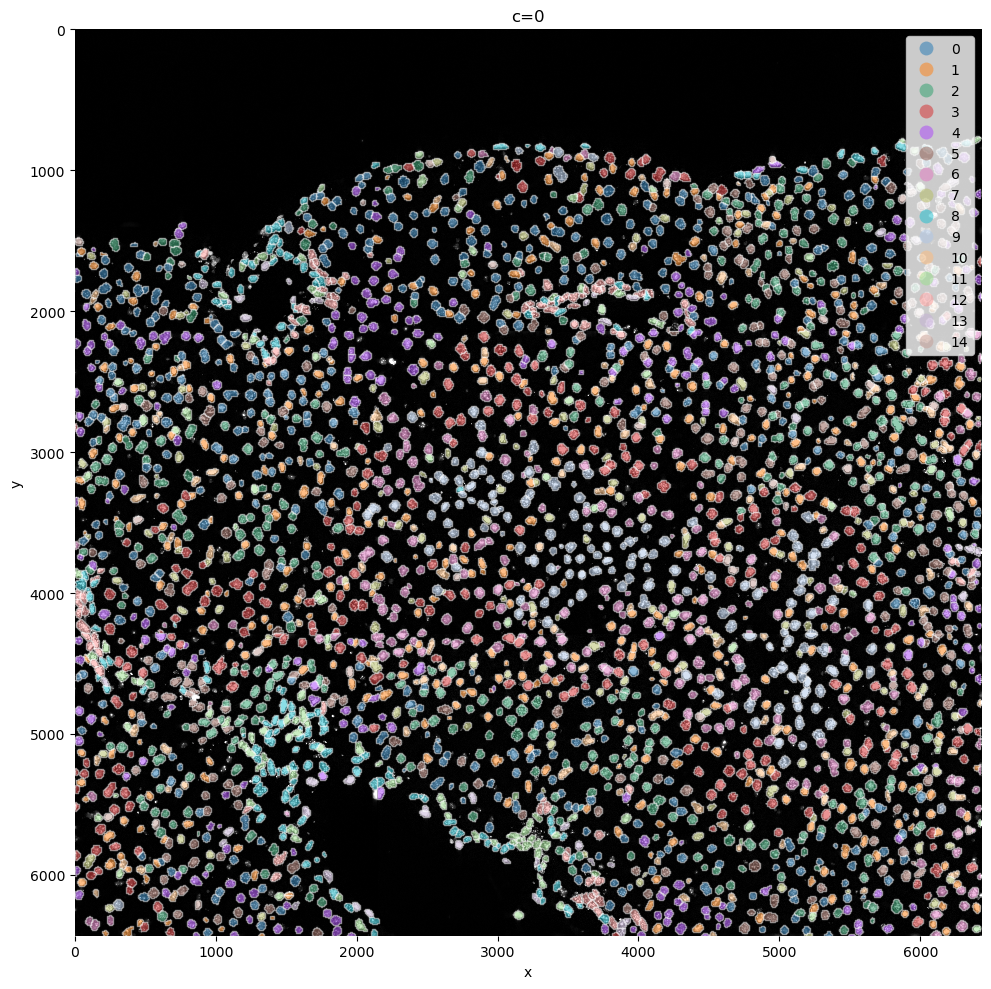

In [29]:
sdata = sp.tb.cluster(sdata, 17, 35)
sp.pl.cluster(sdata)
sp.pl.plot_shapes(sdata, column="leiden", img_layer="clahe", shapes_layer="segmentation_mask_boundaries")

Here we reuse the plot_shapes function to actually plot a subfigure of our image with the cells colored based on the clustering.

## 6. Annotating the cells 

Afte we created the count matrix, we are going to annotate the cells. SPArrOW has its own annotation algorithm, that starts fro m a marker gene list. 
It is an enrichment score algorithm, that compares the expression of marker genes in cells with a celltype weighted average. For this reason, the annotation happens iteratively. 

The input marker gene list should be a csv file, with the marker genes in the rows and the celltypes in the columns. The weight given to a celltype/ marker gene combination should reflect the marker gene specifity of the gene to the celltype.
binary inputs (zero for no marker, 1 for marker) are also accepted. 
A tutorial on how to create such marker genes lists from an atlas will follow. 

A cell is annotated to be unknown if its score is lower than zero for all celltypes. 

As the approach is iterative, the results of every step are shown. 



2024-06-10 10:11:07,241 - sparrow.table._annotation - INFO - scaling based on number of markers per cell type
2024-06-10 10:11:07,260 - sparrow.table._annotation - INFO - Hepatocytes          40.56250
LSEC Central         13.71875
unknown_celltype     11.15625
Cholangiocytes       10.93750
stellate              7.28125
Kupffer cells         5.25000
Fibroblast            3.40625
B cells               2.84375
Other immunecells     2.68750
LSEC Portal           2.15625
Name: annotation_own_score_genes, dtype: float64


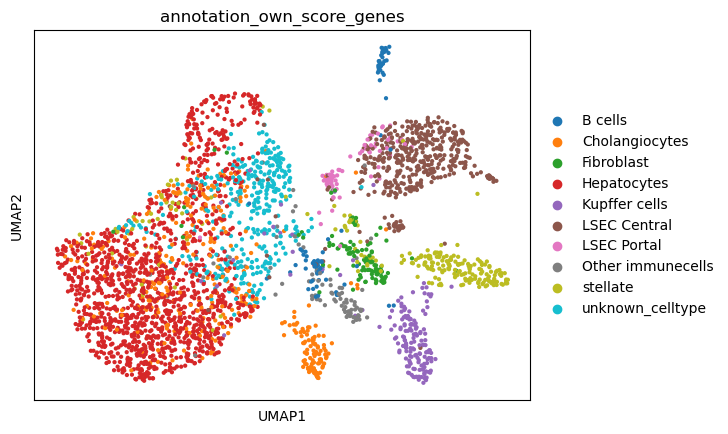

2024-06-10 10:11:07,526 - sparrow.table._annotation - INFO - Iteration 0.
2024-06-10 10:11:07,648 - sparrow.table._annotation - INFO - scaling based on number of markers per cell type
2024-06-10 10:11:07,668 - sparrow.table._annotation - INFO - Percentage of cells with changed annotation: 18.94


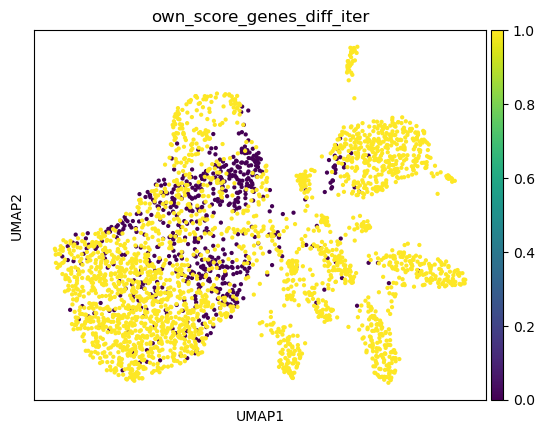

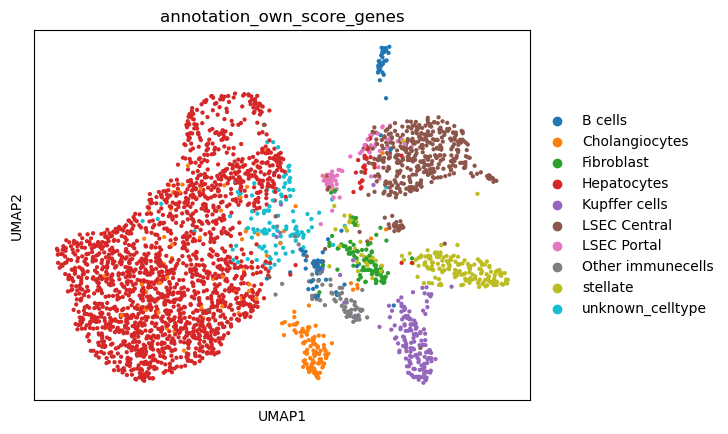

2024-06-10 10:11:08,074 - sparrow.table._annotation - INFO - Hepatocytes          58.09375
LSEC Central         12.78125
stellate              5.90625
Cholangiocytes        5.03125
Kupffer cells         4.93750
unknown_celltype      3.59375
Fibroblast            2.93750
B cells               2.65625
LSEC Portal           2.06250
Other immunecells     2.00000
Name: annotation_own_score_genes, dtype: float64
2024-06-10 10:11:08,075 - sparrow.table._annotation - INFO - Iteration 1.
2024-06-10 10:11:08,203 - sparrow.table._annotation - INFO - scaling based on number of markers per cell type
2024-06-10 10:11:08,224 - sparrow.table._annotation - INFO - Percentage of cells with changed annotation: 3.06


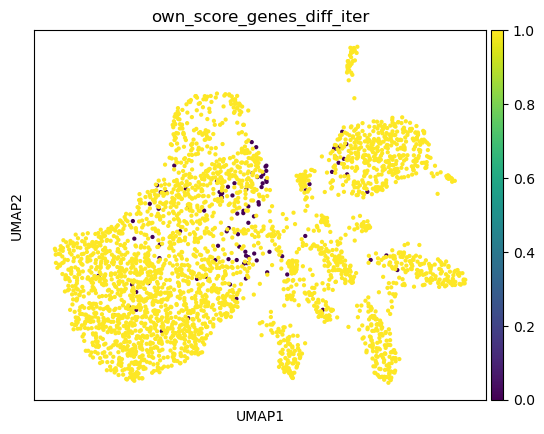

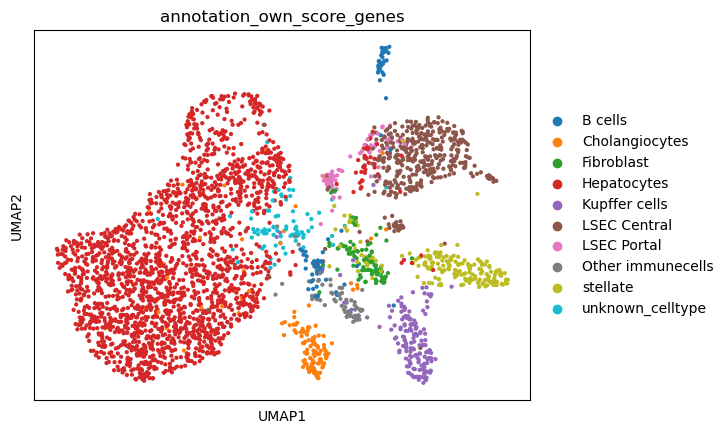

2024-06-10 10:11:08,632 - sparrow.table._annotation - INFO - Hepatocytes          60.93750
LSEC Central         12.37500
stellate              5.81250
Kupffer cells         4.93750
Cholangiocytes        4.06250
Fibroblast            2.90625
B cells               2.65625
unknown_celltype      2.40625
LSEC Portal           1.96875
Other immunecells     1.93750
Name: annotation_own_score_genes, dtype: float64
2024-06-10 10:11:08,633 - sparrow.table._annotation - INFO - Iteration 2.
2024-06-10 10:11:08,757 - sparrow.table._annotation - INFO - scaling based on number of markers per cell type
2024-06-10 10:11:08,778 - sparrow.table._annotation - INFO - Percentage of cells with changed annotation: 0.66


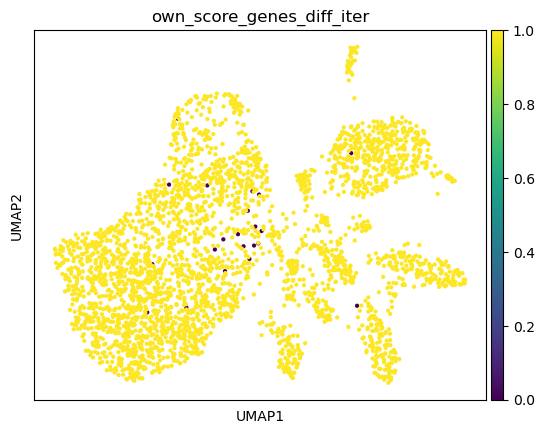

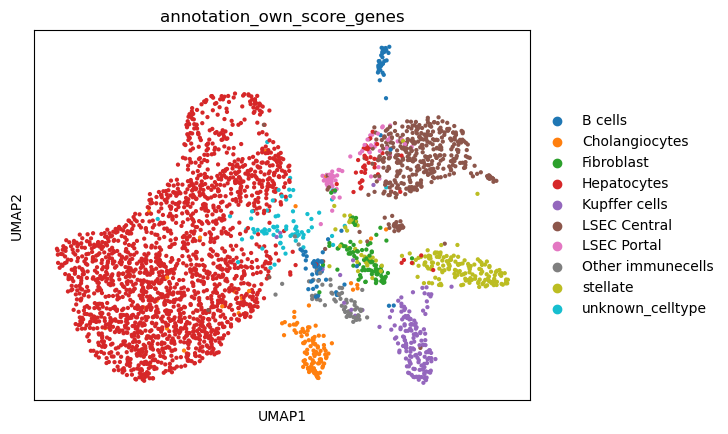

2024-06-10 10:11:09,184 - sparrow.table._annotation - INFO - Hepatocytes          61.46875
LSEC Central         12.37500
stellate              5.81250
Kupffer cells         4.90625
Cholangiocytes        3.71875
Fibroblast            2.90625
B cells               2.68750
unknown_celltype      2.25000
LSEC Portal           1.96875
Other immunecells     1.90625
Name: annotation_own_score_genes, dtype: float64
2024-06-10 10:11:09,185 - sparrow.table._annotation - INFO - Iteration 3.
2024-06-10 10:11:09,317 - sparrow.table._annotation - INFO - scaling based on number of markers per cell type
2024-06-10 10:11:09,338 - sparrow.table._annotation - INFO - Percentage of cells with changed annotation: 0.22


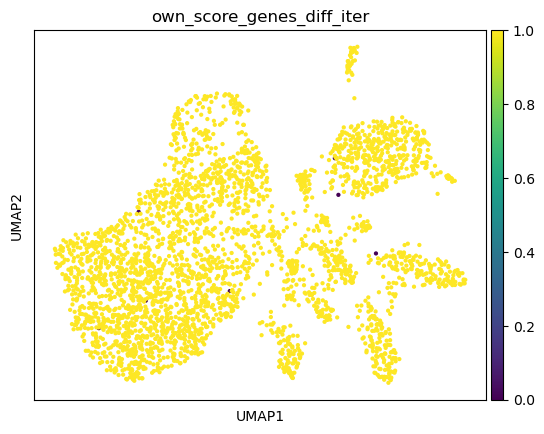

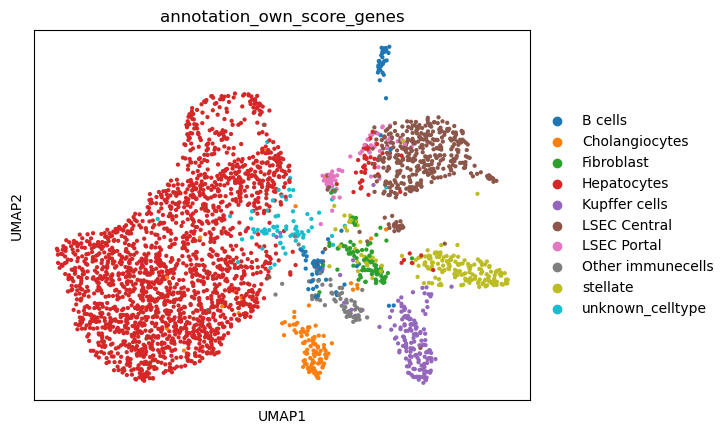

2024-06-10 10:11:10,387 - sparrow.table._annotation - INFO - Hepatocytes          61.68750
LSEC Central         12.31250
stellate              5.78125
Kupffer cells         4.90625
Cholangiocytes        3.59375
Fibroblast            2.90625
B cells               2.68750
unknown_celltype      2.25000
LSEC Portal           1.96875
Other immunecells     1.90625
Name: annotation_own_score_genes, dtype: float64
2024-06-10 10:11:10,389 - sparrow.table._annotation - INFO - Iteration 4.
2024-06-10 10:11:10,512 - sparrow.table._annotation - INFO - scaling based on number of markers per cell type
2024-06-10 10:11:10,533 - sparrow.table._annotation - INFO - Percentage of cells with changed annotation: 0.09


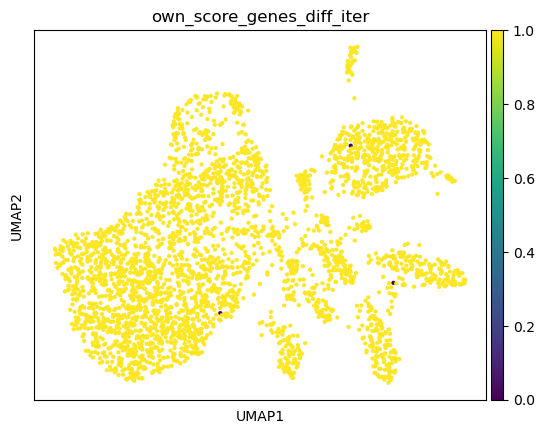

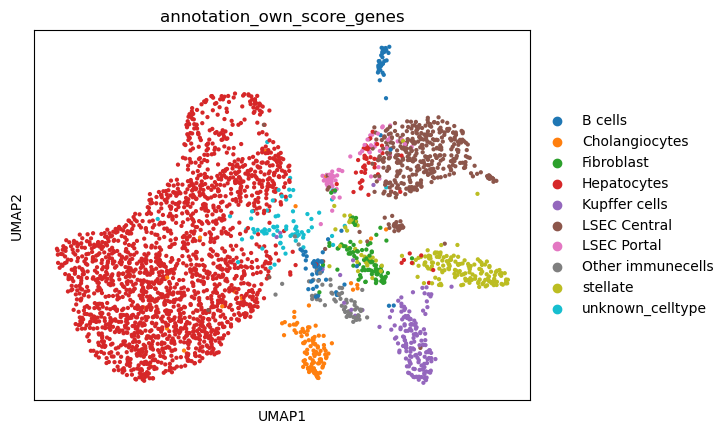

2024-06-10 10:11:10,943 - sparrow.table._annotation - INFO - Hepatocytes          61.78125
LSEC Central         12.28125
stellate              5.75000
Kupffer cells         4.90625
Cholangiocytes        3.56250
Fibroblast            2.90625
B cells               2.68750
unknown_celltype      2.25000
LSEC Portal           1.96875
Other immunecells     1.90625
Name: annotation_own_score_genes, dtype: float64


In [35]:
path_mg = DATA_PATH_PREFIX + "/resolve_liver/markerGeneListMartinSubset.csv"


sdata,scores=sp.tb.score_genes_iter(sdata,path_mg)

#sp.pl.score_genes(sdata=sdata, img_layer="clahe", scoresper_cluster=scoresper_cluster, filter_index=5)

In [39]:
color_dict_RESOLVE={'B cells': '#808000',
 'Cholangiocytes': '#7f007f',
 'Hepatocytes': '#ff8c00',
 'HepatocytesPortal': '#fbceb1',
 'Kupffer cells': '#ff0000',
 'LSEC45': '#00ffff',
 'LSEC Central': '#4169e1',
 'LSEC Portal': '#0000cd',
 'Mesothelial cells': '#808000',
 'VSMC': '#aaffc3',
 'central_vein_EC45': '#00bfff',
 'portal_vein_EC45': '#00fa9a',
 'Other immunecells': '#2e8b57',
 'Fibroblast': '#ff1493',
 'stellate': '#ffea17',
  'unknown_celltype': '#696969',
   'Unknown': '#696969'}

Next, we change the colors to a more readable color scheme, andp lot the annotated data spatially and on a UMAP

In [40]:
sdata.table.uns['annotation_own_score_genes_colors']=[color_dict_RESOLVE[i]for i in sdata.table.obs['annotation_own_score_genes'].astype('category').cat.categories.values]

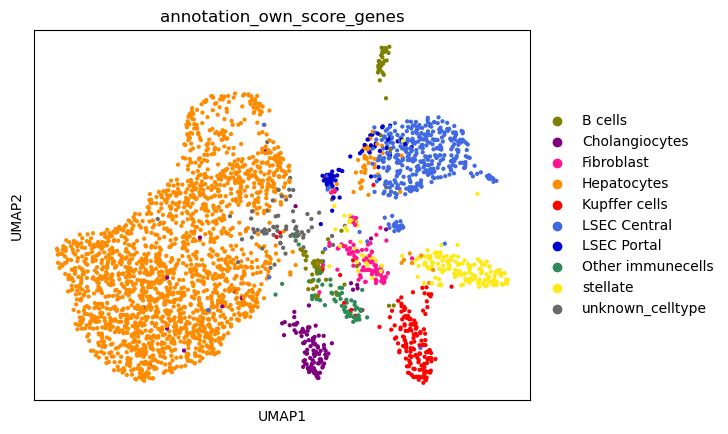

In [43]:
import scanpy as sc
sc.pl.umap(sdata.table, color='annotation_own_score_genes')

In [53]:
sdata

SpatialData object with:
├── Images
│     ├── 'clahe': SpatialImage[cyx] (1, 6432, 6432)
│     ├── 'min_max_filtered': SpatialImage[cyx] (1, 6432, 6432)
│     ├── 'raw_image': SpatialImage[cyx] (1, 6432, 6432)
│     ├── 'tiling_correction': SpatialImage[cyx] (1, 6432, 6432)
│     └── 'transcript_density': SpatialImage[cyx] (1, 6432, 6432)
├── Labels
│     └── 'segmentation_mask': SpatialImage[yx] (6432, 6432)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 3) (2D points)
├── Shapes
│     ├── 'filtered_low_counts_segmentation_mask_boundaries': GeoDataFrame shape: (94, 1) (2D shapes)
│     ├── 'filtered_segmentation_segmentation_mask_boundaries': GeoDataFrame shape: (17, 1) (2D shapes)
│     ├── 'filtered_size_segmentation_mask_boundaries': GeoDataFrame shape: (81, 1) (2D shapes)
│     └── 'segmentation_mask_boundaries': GeoDataFrame shape: (3200, 1) (2D shapes)
└── Table
      └── AnnData object with n_obs × n_vars = 3200 × 97
    obs: 'cell_ID', 'fov_labels', 'n_g

In [59]:
filtered_layers=['filtered_segmentation_segmentation_mask_boundaries','filtered_low_counts_segmentation_mask_boundaries','filtered_size_segmentation_mask_boundaries']

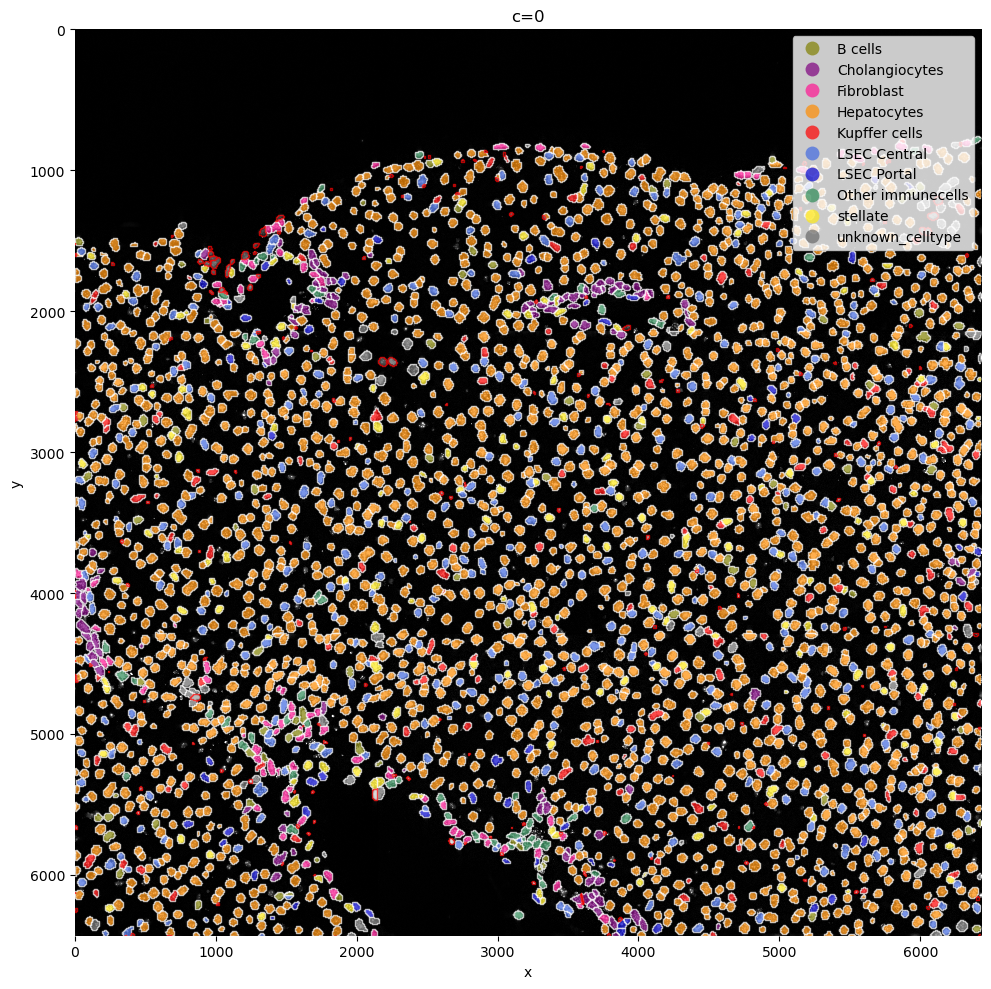

In [60]:
sp.pl.plot_shapes(sdata, column="annotation_own_score_genes", img_layer="clahe", shapes_layer="segmentation_mask_boundaries",alpha=0.7,shapes_layer_filtered=filtered_layers)

Funcitonality from squidpy can be easily used from within SPArrOW, just run it on sdata.table.
We impemented the neighborhood enrichment from scratch.

In [48]:
sdata = sp.tb.nhood_enrichment(sdata,celltype_column='annotation_own_score_genes')

  0%|          | 0/1000 [00:00<?, ?/s]

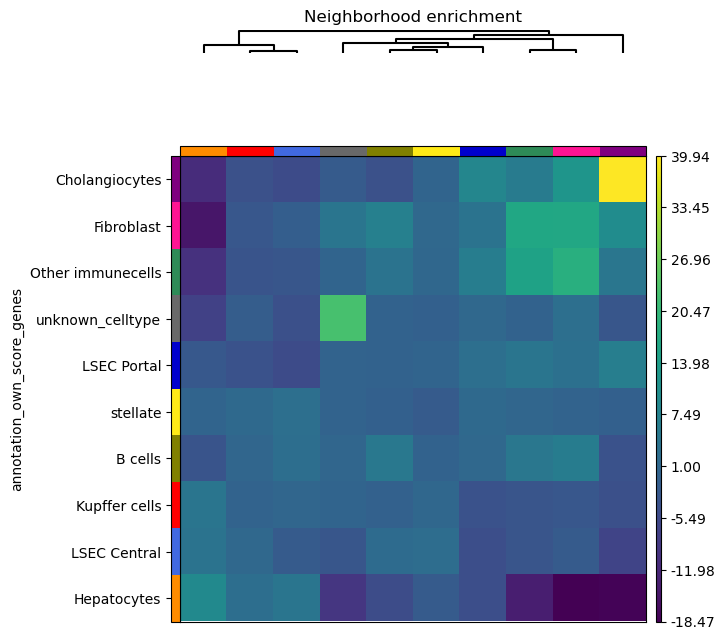

In [50]:
sp.pl.nhood_enrichment(sdata,celltype_column='annotation_own_score_genes')

Use squidpy to see the enrichement between the different celltypes.
For more info, see squidpy!

In [ ]:
### Savi

### Saving the sdata object

Every change is SPArrOW is automaticaaly backed to the sdata object that was created, except for changes to the sdata.table.

All functions in SParrOW back up the sdata.table object, but if you change things personally, please run the cell underneath, so you save the object to disk.

In [61]:
adata=sdata.table.copy()
if sdata.table:
    del sdata.table
import spatialdata
sdata.table = spatialdata.models.TableModel.parse(
    adata
)